In [13]:
### "AE-Canonical" model
# 5 sets of data
# input data = experiment.test_data
# original latents = recon[1]
# original decoded = recon[0]
# perturb latents = perturbed_latents
# perturb decoded = perturbed_decoded

import Canonical_AutoEncoder_Experiment
import sys, jax
import mdtraj as md
import jax.numpy as jnp
import matplotlib.pyplot as plt

jax.config.update("jax_enable_x64", True)

### initiating model
# variable for JSON file
json_fn = "/media/volume/sdb/Timooo/Auto_Encoding_FE/AE_TEST_SMALL_08_3.json"

# Init Experiment
experiment = Canonical_AutoEncoder_Experiment.NN_Experiment(json_fn)

# Loading the model checkpoint
ckpt_fn = "model_ckpt_005000.pkl"
experiment.load_model_from_ckpt(ckpt_fn)

# Save Testing Data
experiment.write_traj("test_data", experiment.test_data)

(2400, 306) (600, 306)
Canonical_AutoEncoder(
    # attributes
    input_size = 306
    hidden_layers = [306, 306, 306]
    n_latents = 8
)
INITIALIZATION COMPLETE


In [2]:
### Defining the coordinates
# SIMULATION ANALYSIS
c = md.load('/media/volume/sdb/Timooo/Auto_Encoding_FE/Simulation/small_test.dcd', top='/media/volume/sdb/Timooo/Auto_Encoding_FE/Simulation/ala_deca_peptide.prmtop')
coords = jnp.array(c.superpose(c).xyz)
print(coords.shape)

# Flatten the dimensions for the model
coords = coords.reshape(coords.shape[0], -1)
print(coords.shape)

(3000, 102, 3)
(3000, 306)


In [3]:
print(experiment.test_data.shape)
experiment.test_data

(600, 306)


Array([[ 9.85367745e-02, -3.76370698e-01,  4.41982806e-01, ...,
        -3.97983134e-01, -3.25987905e-01,  4.84158427e-01],
       [ 1.14457585e-01, -4.57489550e-01,  3.67436767e-01, ...,
        -4.31513071e-01, -3.84603262e-01,  4.62545931e-01],
       [ 1.20101526e-01, -4.82435107e-01,  3.61962914e-01, ...,
        -4.19920564e-01, -1.11386128e-01,  4.41942543e-01],
       ...,
       [ 1.29732072e-01,  2.35240191e-01,  2.12958053e-01, ...,
        -3.42911422e-01, -4.87766042e-03,  6.97460413e-01],
       [-4.07088995e-02,  1.28739491e-01,  2.79521912e-01, ...,
        -3.38905573e-01,  6.00186922e-02,  6.80671334e-01],
       [-4.22372541e-04,  1.87518984e-01,  2.83521861e-01, ...,
        -3.36736321e-01,  4.65050153e-02,  6.80616438e-01]],      dtype=float32)

In [4]:
### Encode -> Latent -> Decode
# 2 products are produced recon[0] and recon[1]
# Latent space is the recon[0] and Decoded space is recon[1] 
recon = experiment.state.apply_fn({'params':experiment.state.params}, experiment.test_data)

# Decoded dimension, Latent dimension
recon[0].shape, recon[1].shape

((600, 306), (600, 8))

In [5]:
### Printing original Latents
# I need to set an option to print all since the array too big.
# I want to see numeric difference for the sake of comparision
# between original and perturbed Latents.

jnp.set_printoptions(threshold=sys.maxsize)
print(recon[1].shape)
recon[1]

(600, 8)


Array([[-0.02667357, -0.07126364,  0.06381402, -0.06383911,  0.09402426,
        -0.06095296, -0.03658621,  0.03879511],
       [-0.02667357, -0.07126364,  0.06381402, -0.06383911,  0.09402426,
        -0.06095296, -0.03658621,  0.03879511],
       [-0.02667357, -0.07126364,  0.06381402, -0.06383911,  0.09402426,
        -0.06095296, -0.03658621,  0.03879511],
       [-0.02667357, -0.07126364,  0.06381402, -0.06383911,  0.09402426,
        -0.06095296, -0.03658621,  0.03879511],
       [-0.02667362, -0.07126367,  0.06381393, -0.06383931,  0.09402442,
        -0.0609531 , -0.03658614,  0.03879508],
       [-0.02667351, -0.07126344,  0.0638141 , -0.06383915,  0.09402409,
        -0.0609528 , -0.03658622,  0.03879522],
       [-0.02667362, -0.07126367,  0.06381393, -0.06383931,  0.09402442,
        -0.0609531 , -0.03658614,  0.03879508],
       [-0.02667351, -0.07126344,  0.0638141 , -0.06383915,  0.09402409,
        -0.0609528 , -0.03658622,  0.03879522],
       [-0.02667357, -0.07126364

In [6]:
### Perturbation
# Select only 1 column of Array to perturb to identify data relation
# Initially, I tried minimal perturbation from 0.1 to 1 to each row in first column
# but decoded items are identical. Later I find that +31 is the least effective change.

perturbed_latents = jnp.array(recon[1]) # copy recon[1] to perturbed_latents
perturbed_latents = perturbed_latents.at[:, 0].add(31) # added perturbed_latents

print(perturbed_latents.shape) # confirm if the shape is still intact
perturbed_latents # print out pLatents

(600, 8)


Array([[30.973326  , -0.07126364,  0.06381402, -0.06383911,  0.09402426,
        -0.06095296, -0.03658621,  0.03879511],
       [30.973326  , -0.07126364,  0.06381402, -0.06383911,  0.09402426,
        -0.06095296, -0.03658621,  0.03879511],
       [30.973326  , -0.07126364,  0.06381402, -0.06383911,  0.09402426,
        -0.06095296, -0.03658621,  0.03879511],
       [30.973326  , -0.07126364,  0.06381402, -0.06383911,  0.09402426,
        -0.06095296, -0.03658621,  0.03879511],
       [30.973326  , -0.07126367,  0.06381393, -0.06383931,  0.09402442,
        -0.0609531 , -0.03658614,  0.03879508],
       [30.973326  , -0.07126344,  0.0638141 , -0.06383915,  0.09402409,
        -0.0609528 , -0.03658622,  0.03879522],
       [30.973326  , -0.07126367,  0.06381393, -0.06383931,  0.09402442,
        -0.0609531 , -0.03658614,  0.03879508],
       [30.973326  , -0.07126344,  0.0638141 , -0.06383915,  0.09402409,
        -0.0609528 , -0.03658622,  0.03879522],
       [30.973326  , -0.07126364

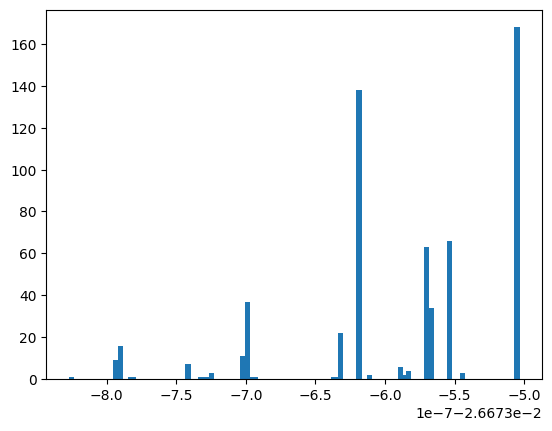

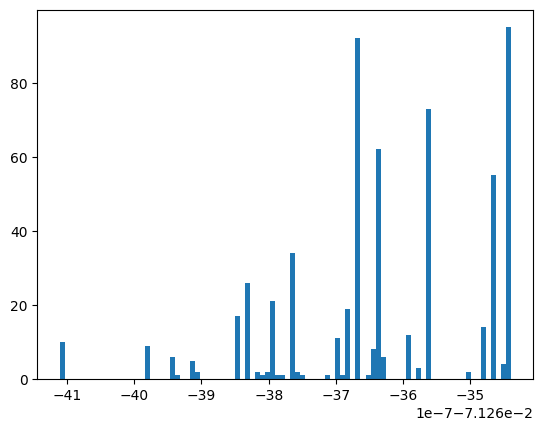

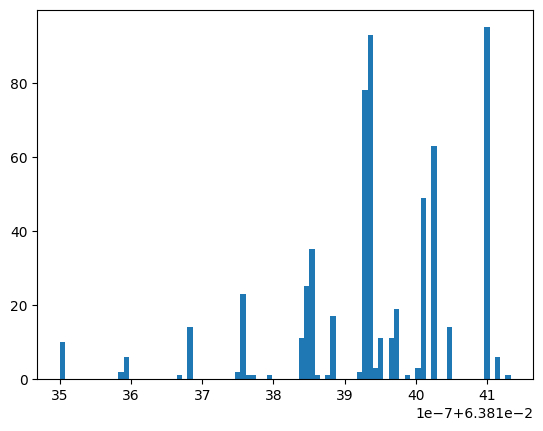

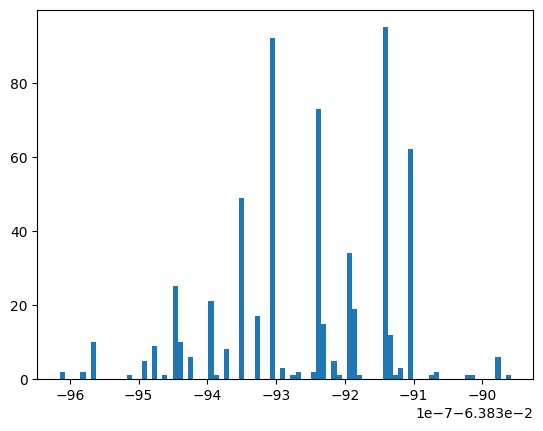

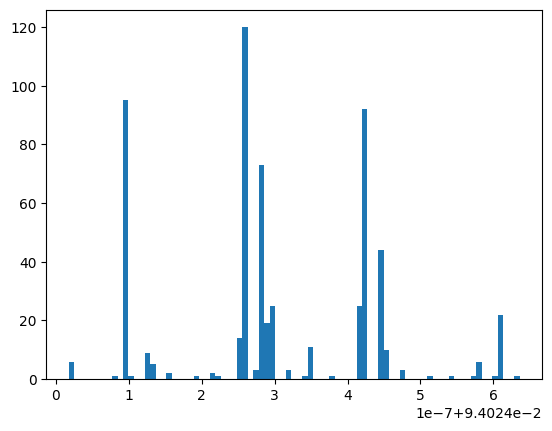

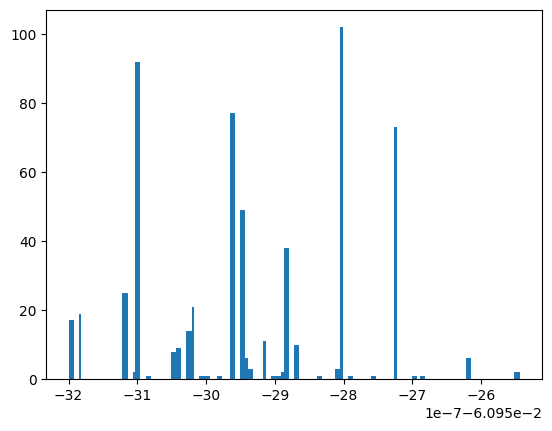

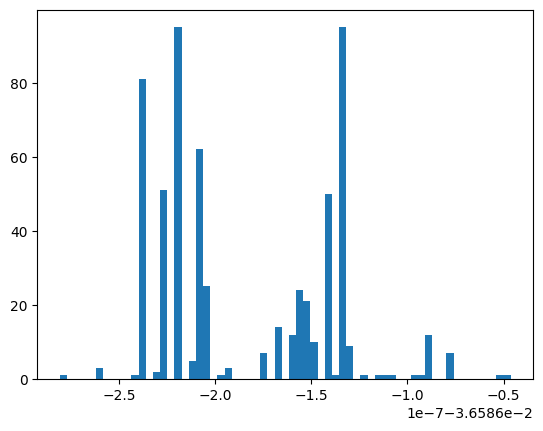

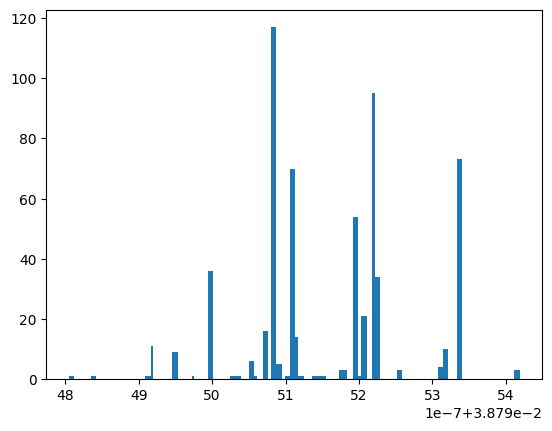

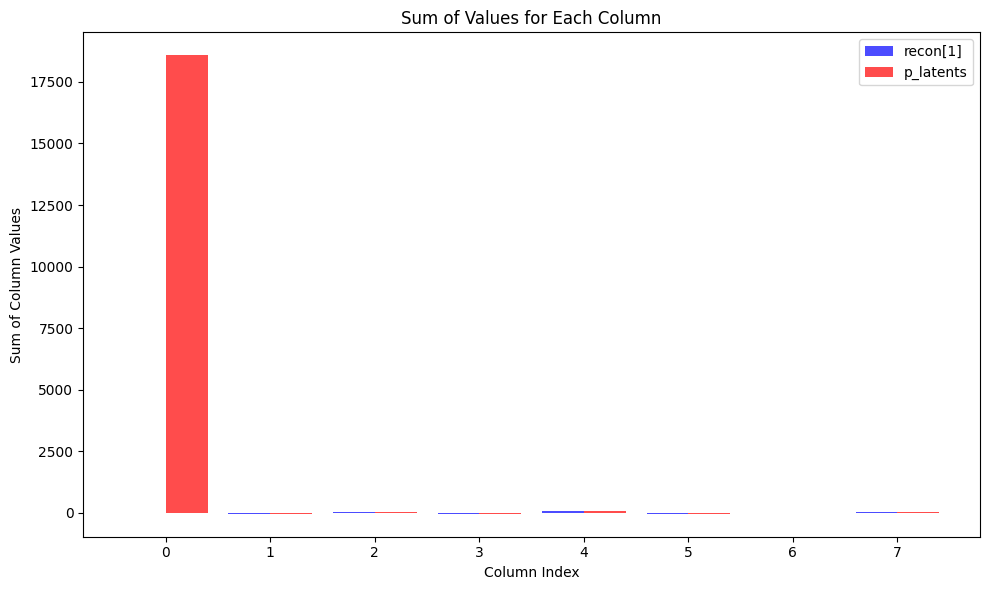

In [7]:
### Visualizing results
# here are some simple histograms and barchart visualized
# I used matplotlib. I should add some title though

for i in range(8): 
    _ = plt.hist(recon[1][:, i], bins=100)
    plt.show()
    
# Side-by-side barchart comparison

def plot_column_sums(recon_data, p_latents_data):
    
    recon_sums = jnp.sum(recon_data, axis=0)
    p_latents_sums = jnp.sum(p_latents_data, axis=0)

    columns = jnp.arange(recon_data.shape[1]) 

    plt.figure(figsize=(10, 6))

    # Bar chart for recon[1]
    plt.bar(columns - 0.2, recon_sums, width=0.4, color='blue', alpha=0.7, label='recon[1]')
    
    # Bar chart for p_latents, shifted slightly to the right 
    plt.bar(columns + 0.2, p_latents_sums, width=0.4, color='red', alpha=0.7, label='p_latents')
    
    plt.xlabel('Column Index')
    plt.ylabel('Sum of Column Values')
    plt.title('Sum of Values for Each Column')
    plt.xticks(columns)
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_column_sums(recon[1], perturbed_latents)


In [8]:
### Printing original Decoded
# verify the shape and value of recon[0] cells

print(recon[0].shape)
recon[0]

(600, 306)


Array([[ 0.11096328, -0.07729283,  0.21588466,  0.09681392, -0.07965162,
         0.21273935,  0.09731102, -0.08101209,  0.21281758,  0.09618107,
        -0.0809546 ,  0.2095738 ,  0.17148471, -0.06384791,  0.23022345,
         0.23571251, -0.06226211,  0.22330372,  0.12003557, -0.05528944,
         0.24114642,  0.04539612, -0.05953424,  0.23937687,  0.1622889 ,
        -0.04195651,  0.23867354,  0.16164273, -0.0342577 ,  0.23208001,
         0.09906269, -0.00652558,  0.23572114,  0.08547647,  0.00295791,
         0.23109868,  0.08355536,  0.0037048 ,  0.2349332 ,  0.08209874,
        -0.00043315,  0.22755918,  0.23643059, -0.07467631,  0.23890379,
         0.23354992, -0.04655585,  0.24244288,  0.24111423, -0.13260339,
         0.2320207 ,  0.23989283, -0.15139812,  0.2361449 ,  0.23465386,
        -0.16837731,  0.2392214 ,  0.23966914, -0.22393948,  0.23601863,
         0.24141556, -0.19317329,  0.23866846,  0.23905414, -0.19831884,
         0.23592761,  0.24569386, -0.19752866,  0.2

In [9]:
### Perturbed Decoded
# decode the perturbed_latents and print out
# the shape and value if it

perturbed_decoded = experiment.model.apply({'params': experiment.state.params}, perturbed_latents, method=experiment.model.decode)

print(perturbed_decoded.shape)
perturbed_decoded

(600, 306)


Array([[ 0.11096081, -0.07729231,  0.21588394,  0.09681468, -0.07964993,
         0.2127358 ,  0.0973119 , -0.08100973,  0.21281587,  0.0961801 ,
        -0.08095449,  0.20957027,  0.17148316, -0.06384718,  0.23022304,
         0.23571101, -0.06226107,  0.2233018 ,  0.1200341 , -0.0552887 ,
         0.24114498,  0.04539669, -0.05953225,  0.23937407,  0.16228771,
        -0.0419568 ,  0.23867059,  0.161642  , -0.03425777,  0.23207751,
         0.09906231, -0.00652594,  0.23571923,  0.0854755 ,  0.00295975,
         0.23109847,  0.08355223,  0.00370448,  0.23493063,  0.0821    ,
        -0.00043409,  0.22755617,  0.23642877, -0.07467452,  0.23890185,
         0.23354787, -0.04655593,  0.24244028,  0.24111253, -0.13260233,
         0.23201784,  0.2398899 , -0.15139648,  0.23614118,  0.23465182,
        -0.16837633,  0.23922029,  0.23966654, -0.22393866,  0.2360157 ,
         0.24141313, -0.1931701 ,  0.23866594,  0.23905215, -0.19831705,
         0.23592475,  0.24569136, -0.19752756,  0.2

In [10]:
### Comparison between original and perturbed Decoded
# Why are they the same?!
# Edit : 09/25 Not anymore!

def compare_arrays(arr1, arr2):

    diff_cells = jnp.argwhere(arr1 != arr2)
    
    return diff_cells

diff_cells = compare_arrays(recon[0], perturbed_decoded)
print(f"Different indices: {diff_cells}")

recon[0] == perturbed_decoded

Different indices: [[  0   0]
 [  0   1]
 [  0   2]
 [  0   3]
 [  0   4]
 [  0   5]
 [  0   6]
 [  0   7]
 [  0   8]
 [  0   9]
 [  0  10]
 [  0  11]
 [  0  12]
 [  0  13]
 [  0  14]
 [  0  15]
 [  0  16]
 [  0  17]
 [  0  18]
 [  0  19]
 [  0  20]
 [  0  21]
 [  0  22]
 [  0  23]
 [  0  24]
 [  0  25]
 [  0  26]
 [  0  27]
 [  0  28]
 [  0  29]
 [  0  30]
 [  0  31]
 [  0  32]
 [  0  33]
 [  0  34]
 [  0  35]
 [  0  36]
 [  0  37]
 [  0  38]
 [  0  39]
 [  0  40]
 [  0  41]
 [  0  42]
 [  0  43]
 [  0  44]
 [  0  45]
 [  0  46]
 [  0  47]
 [  0  48]
 [  0  49]
 [  0  50]
 [  0  51]
 [  0  52]
 [  0  53]
 [  0  54]
 [  0  55]
 [  0  56]
 [  0  57]
 [  0  58]
 [  0  59]
 [  0  60]
 [  0  61]
 [  0  62]
 [  0  63]
 [  0  64]
 [  0  65]
 [  0  66]
 [  0  67]
 [  0  68]
 [  0  69]
 [  0  70]
 [  0  71]
 [  0  72]
 [  0  73]
 [  0  74]
 [  0  75]
 [  0  76]
 [  0  77]
 [  0  78]
 [  0  79]
 [  0  80]
 [  0  81]
 [  0  82]
 [  0  83]
 [  0  84]
 [  0  85]
 [  0  86]
 [  0  87]
 [  0  88]
 [

Array([[False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
      

In [11]:
# Last thing to do is to try to write it to a .dcd file
# Then put it in Chimera and visualize it
# Be sure to change the model name first!

experiment.write_traj("original_decoded_AE-Canonical_model:", recon[0])
experiment.write_traj("perturbed_decoded", perturbed_decoded)